# Stereo SLAM

This is a major part of this project and will likely take some time. 

For stereo, feel free to look up existing tutorials that implement this and write your own code here. Do not spend too long tweaking parameters here, focus on getting decent results and move on. You can also use OpenCV functions to backproject to 3D. 

## PART 1: Stereo dense reconstruction

3-D point clouds are very useful in robotics for several tasks such as object detection, motion estimation (3D-3D matching or 3D-2D matching), SLAM, and other forms of scene understanding.  Stereo camerasprovide  us  with  a  convenient  way  to  generate  dense  point  clouds.Densehere,  in  contrast  tosparse,means all the image points are used for the reconstruction.  In this part of the assignment you will begenerating a dense 3D point cloud reconstruction of a scene from stereo images.

#### Procedure: 

<ol>
    <li> Generate a disparity map for each stereo pair.  Use OpenCV (e.g.  StereoSGBM) for this.  Note that the images provided are already rectified and undistorted. </li>
    <li> Then, using the camera parameters and baseline information generate colored point clouds from each disparity map.  Some points will have invalid disparity values, so ignore them.  Use [Open3D] for storing your point clouds. </li>
    <li> Register (or transform) all the generated point clouds into your world frame by using the provided ground truth poses. </li>
    <li> Visualize the registered point cloud data, in color.  Use Open3D for this </li>
</ol>
    
    
Write briefly about how the disparity map is generated (if you used SGBM, write about SGBM).</br>
**Disparity Map:** </br>
Disparity is generally the difference in the position of an object we see from the left and right eye. This difference is due to the parallax between the eyes. So, this data is used by our brain to find the depth.

1. We take the right image and break it into blocks of specific dimension.
2. Similar process is done on the left image as well.
3. Now, we set a range of pixels in which we compare the blocks from right and left images inorder to match them.
4. We calculate the SAD/SSD such that the value is minimum between the corresponding blocks. With this SAD/SSD value, we find the disparity.
5. The disparity obtained in above step is stored in a null image of same dimensions as the original image in the respective position.
6. Step-5 is repeated on all blocks in right image generating the disparity map.
</br>
**SGBM:** In SGBM, instead of directly taking the images, rectified left and right images are taken. As the raw images might not have identical vertical coordinates due to the change in camera positions. In this algorithm, the images are rectified to make all their epipolar lines parallel to horizontal axis and then stereo matching is performed. 

In [9]:
import os
import cv2
import open3d as o3d
import matplotlib.pyplot as plt
import numpy as np
import copy

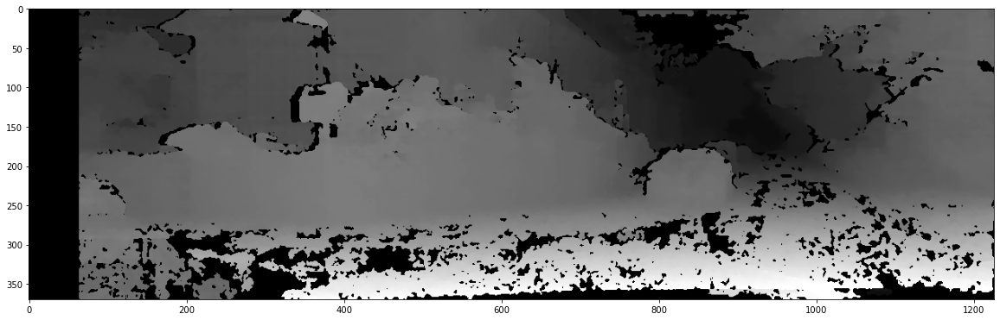

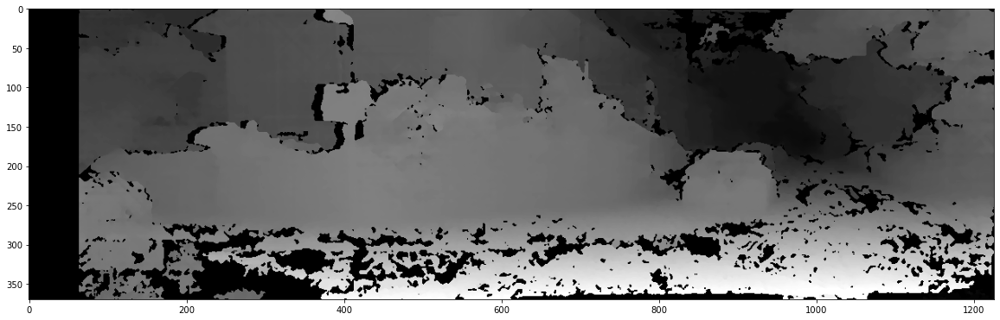

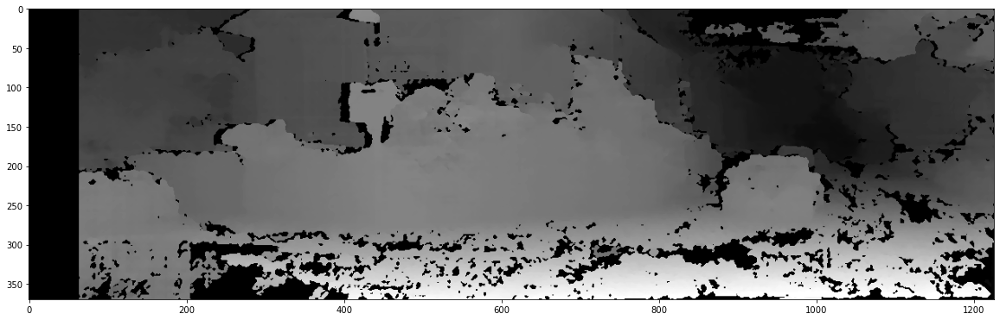

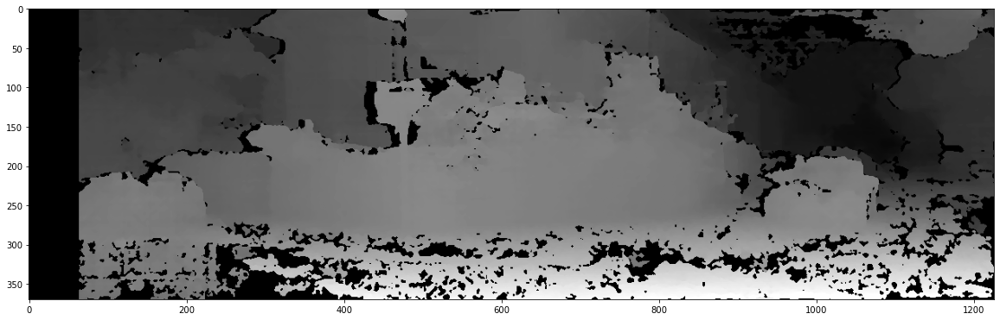

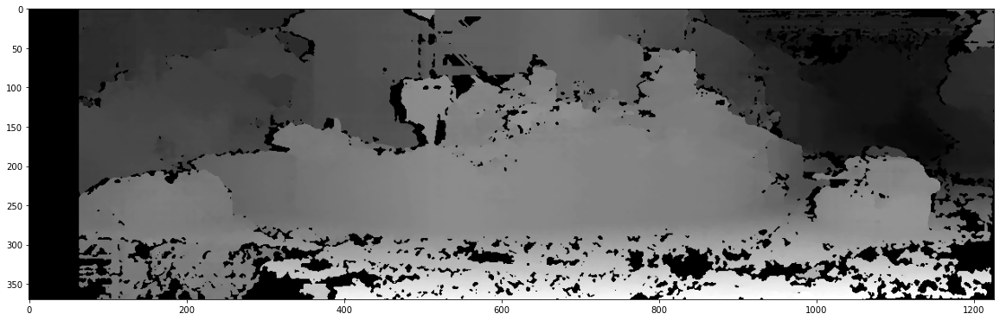

...

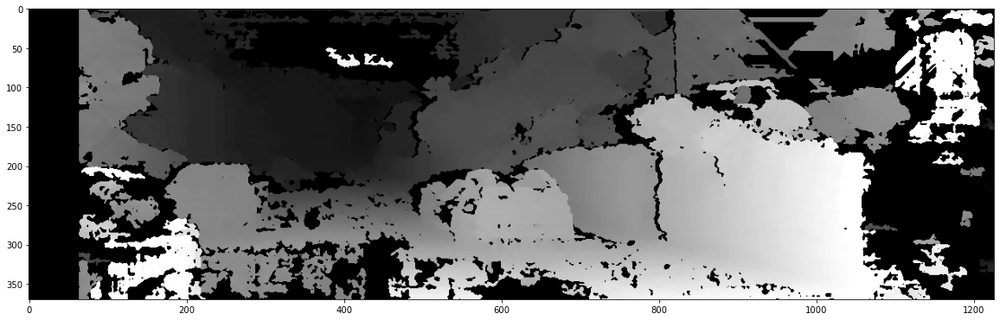

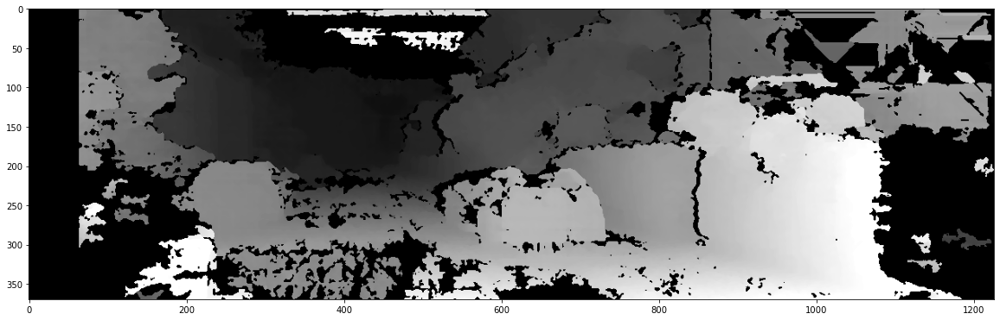

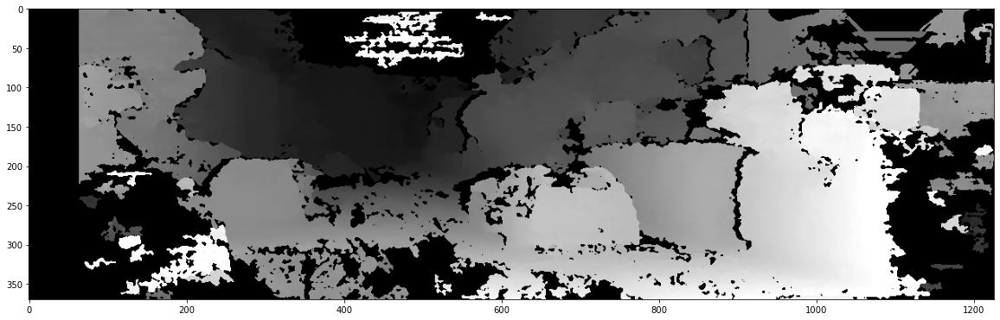

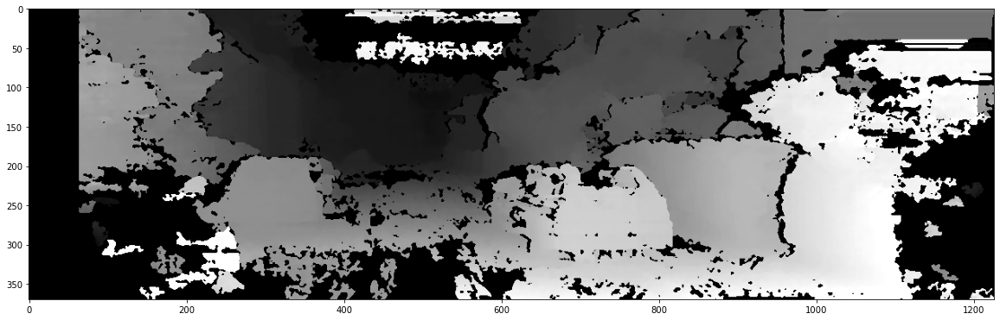

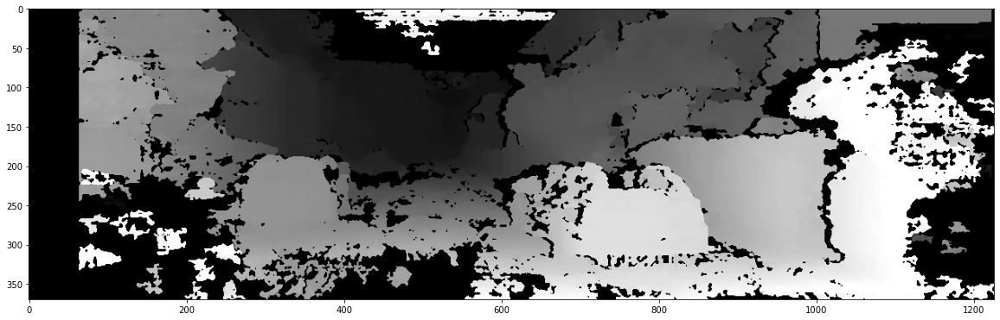

In [10]:
image_names = os.listdir('../data/img2')
path_l = '../data/img2/'
path_r = '../data/img3/'
# out_path = '../results/disparities/'
disparity_maps = []
left_ims = []
right_ims = []
for name in image_names:
    im_left = cv2.imread(path_l + name)
    im_right = cv2.imread(path_r + name)
    left_ims.append(cv2.cvtColor(im_left, cv2.COLOR_BGR2RGB))
    right_ims.append(cv2.cvtColor(im_right, cv2.COLOR_BGR2RGB))
    im_left = cv2.cvtColor(im_left, cv2.COLOR_BGR2GRAY)
    im_right = cv2.cvtColor(im_right, cv2.COLOR_BGR2GRAY)
    
    stereo = cv2.StereoSGBM.create(minDisparity = 0,
        numDisparities = 64,
        blockSize = 5,P1 = 8*3*5**2,P2 = 32*3*5**2, disp12MaxDiff = 1, preFilterCap = 0,
        uniquenessRatio = 10, speckleWindowSize = 200, speckleRange = 2)
    
    disparity_map = stereo.compute(im_left, im_right)
    disparity_map = disparity_map.astype(np.float32)/16.0
    
    plt.figure(figsize = (20,10))
    plt.imshow(disparity_map,'gray')
    plt.show()
    disparity_maps.append(disparity_map)
#     cv2.imwrite((out_path + name), disparity_map)
# plt.figure(figsize = (20,10))
# plt.imshow(disparity_map, cmap = 'gray')

In [11]:
f = open("../data/calib.txt", "r")
x = f.readlines()
f.close()

K = np.fromstring(x[1], dtype=float, sep = " ").reshape((3,3))
baseline = float(x[4][:-3])

In [12]:
print(K)
print(baseline)

[[707.0912   0.     601.8873]
 [  0.     707.0912 183.1104]
 [  0.       0.       1.    ]]
0.53790448812


Now,
<br>Z = b * f / d
<br>X = (u - cx) * Z / f
<br>Y = (v - cy) * Z / f

In [13]:
def get_3d_points(disparity_map, K, baseline, image):
    f = K[0,0]
    scale_factor = f * baseline
    cx = K[0,2]
    cy = K[1,2]
    K_inv = np.linalg.inv(K)
    
    points = []
    points_coordinates = np.argwhere(disparity_map > 0)
    
    for i in range(points_coordinates.shape[0]):
        v,u = points_coordinates[i]
        Z = scale_factor / disparity_map[v,u]
#         X = (u - cx) * Z / f
#         Y = (v - cy) * Z / f
#         points.append(np.array([X,Y,Z]))
        p = Z * (K_inv @ np.array([[u, v, 1]]).T)
        points.append(p[:,0])
#         print(p)
        
    points = np.array(points)
    return points

def get_pcd(disparity_map, K, baseline, image):
    points_coordinates = np.argwhere((disparity_map > 0))
    colors = []
    for i in range(points_coordinates.shape[0]):
        v,u = points_coordinates[i]
        colors.append(image[v,u])

    points = get_3d_points(disparity_map, K, baseline, image)
#     points[:,1] *= -1
    
    colors = np.array(colors) / 255
    
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(points)
    pcd.colors = o3d.utility.Vector3dVector(colors)
    return pcd

In [14]:
pcd = get_pcd(disparity_map, K, baseline, left_ims[-1])
o3d.visualization.draw_geometries([pcd])

In [15]:
def get_poses(file_path):
    f = open(file_path, "r")
    pose_strings = f.readlines()
    f.close()
    poses = []
    for p in pose_strings:
#         print(p)
        poses.append(np.fromstring(p, dtype = float, sep = " ").reshape((3,4)))

    return poses

In [17]:
pcds = []
image_names = os.listdir(path_l)
pcd_path = "../results/point_clouds/"
for i in range(len(disparity_maps)):
    pcd = get_pcd(disparity_maps[i], K, baseline, left_ims[i])
    
#     o3d.visualization.draw_geometries([pcd])
    pcds.append(pcd)
#     o3d.io.write_point_cloud(pcd_path + image_names[i][:-4] + ".pcd", pcd)

flag = 1

In [18]:
poses = get_poses("../data/poses.txt")
if flag == 1:
    pcds[0].transform((np.vstack((poses[0], [[0, 0, 0, 1]]))))
    pcds[0].transform([[-1, 0, 0, 0], [0, -1, 0, 0], [0, 0, 1, 0], [0, 0, 0, 1]])
    
    pcd_registered = copy.deepcopy(pcds[0])

    for i in range(1, len(pcds)):
        pcds[i].transform((np.vstack((poses[i], [[0, 0, 0, 1]]))))
        pcds[i].transform([[-1, 0, 0, 0], [0, -1, 0, 0], [0, 0, 1, 0], [0, 0, 0, 1]])

        pcd_registered = pcd_registered +  pcds[i]
    flag = 0

In [19]:
o3d.visualization.draw_geometries([pcd_registered])

In [20]:
o3d.visualization.draw_geometries(pcds)

## PART 2: Motion estimation using iterative PnP

Using the generated reconstruction from the previous part, synthesize a new image taken by a virtual monocular camera fixed at any arbitrary position and orientation.  Your task in this part is to recover this pose using an iterative Perspective-from-n-Points (PnP) algorithm. 

#### Procedure: 

<ol>
    <li> Obtain a set of 2D-3D correspondences between the the image and the point cloud.  Since here you’re generating the image, this should be easy to obtain. </li>
    <li> For this set of correspondences compute the total reprojection error c= $\sum_{i} ‖x_i−P_{k}X_i‖^2 $    where $P_{k}= K[R_{k}|t_{k}]$, $X_{i}$ is the 3D point in the world frame, $x_{i}$ is its corresponding projection. </li>
    <li> Solve for the pose $T_{k}$ that minimizes this non-linear reprojection error using a Gauss-Newton (GN) scheme.  Recall that in GN we start with some initial estimated value $x_{o}$ and iteratively refine the estimate using $x_{1}$= $∆x+x_0$, where $∆x$ is obtained by solving the normal equations $J^{T}J∆x$= -$J^{T}e$, until convergence.The main steps in this scheme are computing the corresponding Jacobians and updating the estimates correctly.  For our problem,  use a 12×1 vector parameterization for $T_{k}$(the top 3×4submatrix).  Run the optimization for different choices of initialization and report your observations. </li>
</ol>

Make sure that you write about how you calculate the residual and jacobians. Do not just include the code. The pose that you have been given is the ground truth, so using that will obviously give good results for optimization, so try out something else as well.
![alt text](../data/jacobian.jpeg "jacobian")

In [21]:
def get_correspondences(disparity_map, pose_matrix, K, baseline, image):
    x = np.argwhere(disparity_map > 0)
    x[:,[0,1]] = x[:,[1,0]]
    X = get_3d_points(disparity_map, K, baseline, image)
    
    X_homo = np.hstack((X, np.ones((X.shape[0], 1))))
    p = np.vstack((pose_matrix, [0,0,0,1]))
    X_W = (p @ X_homo.T).T[:,0:3]
    return X_W, x

In [22]:
# not normalised
def project_points(X, P):
    X_homo = np.hstack((X, np.ones((X.shape[0], 1))))
    projected_points = (P @ X_homo.T).T
    projected_points = projected_points / (projected_points[:,2].reshape((-1,1)))
    projected_points = projected_points[:,0:2]
    return projected_points

In [23]:
def get_residual(X, x, P):
    projected_points = project_points(X, P)
    return (projected_points[:,0:2] - x).reshape((-1,1))

def get_reprojection_error(X, x, P):
    error = np.sum(get_residual(X, x, P) ** 2)
    return error

In [24]:
def Jacobian(X, P):
    A, B, C = X.T
    X_homo = np.hstack((X, np.ones((X.shape[0], 1))))
    u,v,w = (P @ X_homo.T)
    
    J = np.zeros((X.shape[0], 24))
    J[:,0] = A / w
    J[:,1] = B / w
    J[:,2] = C / w
    J[:,3] = 1 / w
    
    J[:,16] = J[:,0]
    J[:,17] = J[:,1]
    J[:,18] = J[:,2]
    J[:,19] = J[:,3]
    
    J[:,8] = -A * u / w**2
    J[:,9] = -B * u / w**2
    J[:,10] = -C * u / w**2
    J[:,11] = -u / w**2
    
    J[:,20] = -A * v / w**2
    J[:,21] = -B * v / w**2
    J[:,22] = -C * v / w**2
    J[:,23] = -v / w**2
    
    return J.reshape((-1, 12))

In [50]:
def estimate_pose_GN(T0, X, x, K, num_iter, tol = 1e-20, plot_error = True):
    P = K @ T0
    if plot_error:
        errors = [get_reprojection_error(X, x, P)]
        
    for i in range(num_iter):
        rk = get_residual(X, x, P)
        Jr = Jacobian(X, P)
        pinv_J = np.dot(np.linalg.inv(np.dot(Jr.T, Jr)), Jr.T)
        delta_P_vect = -np.dot(pinv_J, rk)
        
        if (np.all(np.abs(delta_P_vect)) <= tol):
            break
        
        P = P + delta_P_vect.reshape((3,4))
        
        if plot_error:
            errors.append(get_reprojection_error(X, x, P))

    if plot_error:
        plt.plot(np.arange(len(errors)), errors)
        plt.xlabel("Iterations")
        plt.ylabel("Projection Error")
        plt.show()
        
#     print("Final error =", get_reprojection_error(X, x, P))
    T = np.linalg.inv(K) @ P
    return T

In [51]:
correspondences = get_correspondences(disparity_maps[0], poses[0], K, baseline, left_ims[0])
correspondences

(array([[-178.83056669,   -6.01485979,   15.1875483 ],
        [-179.04302778,   -5.85213167,   16.00125561],
        [-179.12460703,   -5.81113294,   16.2130476 ],
        ...,
        [-193.01398788,    3.85353318,   50.21872885],
        [-193.02175637,    3.85388477,   50.22225408],
        [-193.02952486,    3.85423636,   50.2257793 ]]),
 array([[  64,    0],
        [  65,    0],
        [  66,    0],
        ...,
        [1031,  369],
        [1032,  369],
        [1033,  369]], dtype=int64))

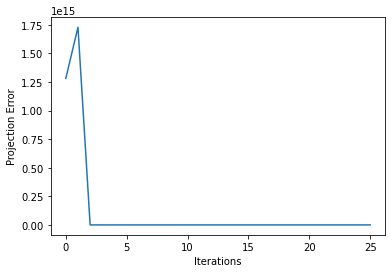

In [52]:
np.random.seed(3)
T0 = np.random.rand(3,4)
T = estimate_pose_GN(T0, correspondences[0], correspondences[1], K, 25, tol = 1e-20, plot_error = True)

In [53]:
def get_M(x, X):
    Np = x.shape[0]
    M=[]
    for i in range(Np):
        xt,yt = x[i,0],x[i,1]
#         print(xt,yt)
        Xt,Yt,Zt = X[i,0],X[i,1],X[i,2]
        M.append([-Xt,-Yt,-Zt,-1,0,0,0,0,xt*Xt,xt*Yt,xt*Zt,xt])
        M.append([0,0,0,0,-Xt,-Yt,-Zt,-1,yt*Xt,yt*Yt,yt*Zt,yt])
    return np.asarray(M) 
def get_P_DLT(x, X):
    M = get_M(x,X)
    U,D,Vt = np.linalg.svd(M, full_matrices=False)
    p = Vt[-1,:]/Vt[-1,-1]
    P = p.reshape(3,4)
    return P

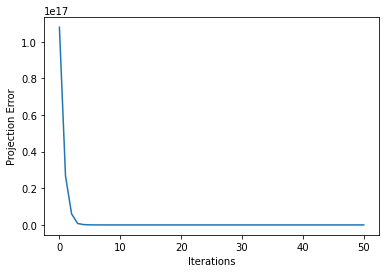

In [54]:
T1 = get_P_DLT(correspondences[1],correspondences[0])
T_dlt = estimate_pose_GN(T1, correspondences[0], correspondences[1], K, 50, tol = 1e-20, plot_error = True)

## PART 3: Odometry Calculation

In part 1, you used the ground truth pose for registration. Here, try to estimate the pose using the RGB image data alone. 

#### Procedure:

1. This can be done by computing features across the two images and matching them. Since you already have the depth map, you now have correspondences between the depth maps of two images as well from the RGB feature matches. 
2. You can now convert this depth map to a point cloud.
3. Since you have correspondences between image points in the depth map, you have 3D correspondences here as well. Perform ICP here to get a good pose estimate.
4. Feed these initial pose estimates into the PnP pipeline and optimise further.

In [55]:
# !pip install opencv-contrib-python

In [56]:
%matplotlib inline

def feature_matching(img1, img2):
    orb = cv2.ORB_create()
    
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    key1, des1 = orb.detectAndCompute(gray1,None)
    key2, des2 = orb.detectAndCompute(gray2,None)
    
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1,des2)
    matches = sorted(matches, key = lambda x:x.distance)
    img3 = cv2.drawMatches(img1,key1,img2,key2,matches,img2, flags=2)

    plt.figure(figsize = (20,10))
    plt.imshow(img3)
    plt.show()
    
    points1 = ([key1[m.queryIdx].pt for m in matches])
    points2 = ([key2[m.trainIdx].pt for m in matches])
    return points1,points2

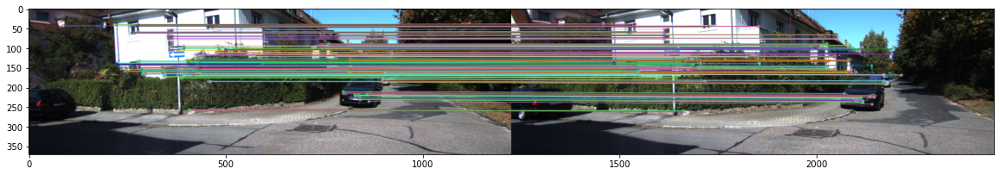

In [57]:
c1 = feature_matching(left_ims[0].copy(), left_ims[1].copy())

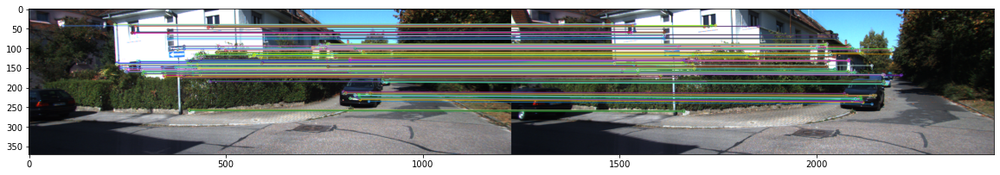

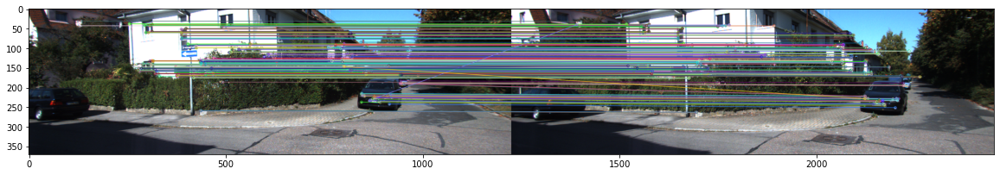

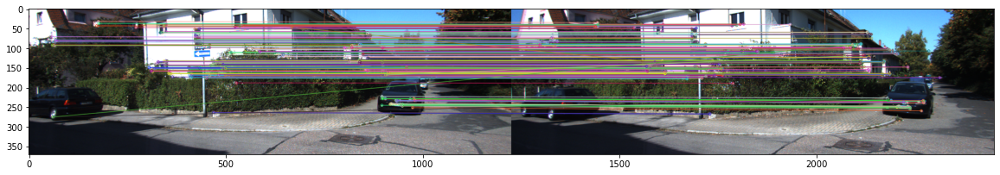

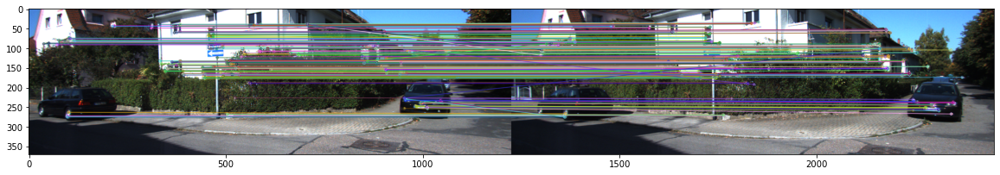

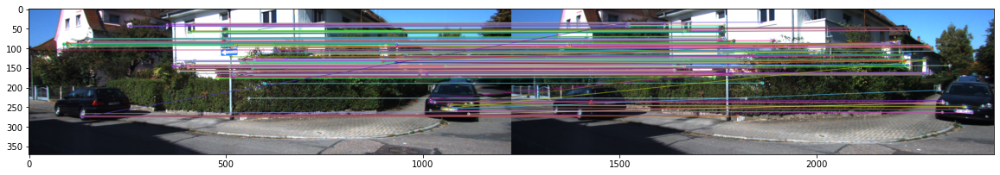

...

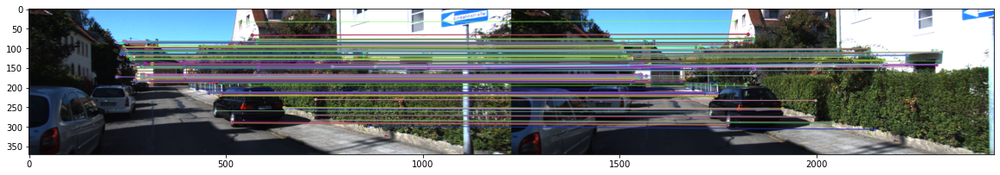

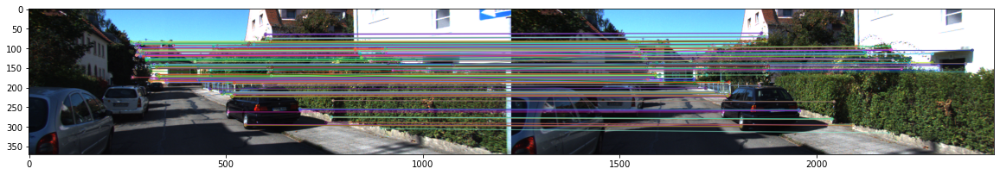

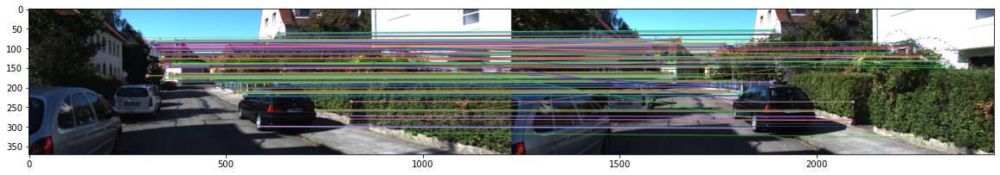

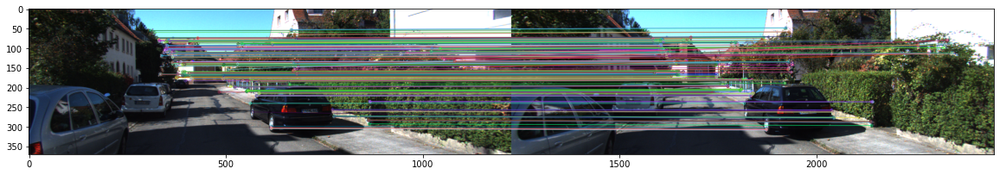

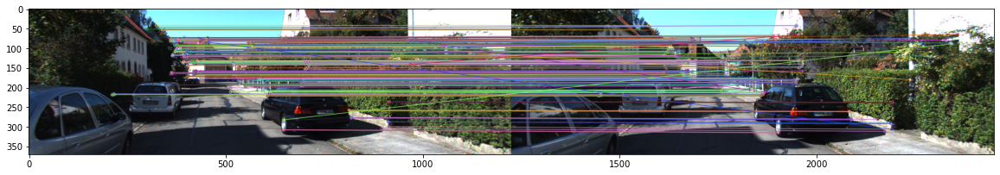

In [58]:
c1 = []
c2 = []

for i in range(len(left_ims)-1):
    corr = feature_matching(left_ims[i], left_ims[i+1])
    c1.append(corr[0])
    c2.append(corr[1])

In [59]:
def get_pcds_feature(disparity_map1, disparity_map2, K, baseline, image1, image2, feature_corr1, feature_corr2):
    dis1 = np.zeros(disparity_map1.shape, np.float32)
    
    for p in feature_corr1:
        h,w = int(p[1]), int(p[0])
        dis1[h,w] = disparity_map1[h,w]
        
    dis2 = np.zeros(disparity_map2.shape, np.float32)
    
    for p in feature_corr2:
        h,w = int(p[1]), int(p[0])
        dis2[h,w] = disparity_map2[h,w]
    
    pc = np.where((dis1 <= 0) & (dis2 <= 0))
    dis1[pc] = 0
    dis2[pc] = 0
    assert len(dis1[1] > 0) == len(dis2[2] > 0)
#     print(len(dis1[1] > 0))
#     print(len(dis2[2] > 0))
    colors1 = []
    points_coordinates = np.argwhere(dis1 > 0)
    for i in range(points_coordinates.shape[0]):
        v,u = points_coordinates[i]
        colors1.append(image1[v,u])

    points1 = get_3d_points(dis1, K, baseline, image1)
#     print(len(points1))
    
    colors1 = np.array(colors1) / 255
    
    pcd1 = o3d.geometry.PointCloud()
    pcd1.points = o3d.utility.Vector3dVector(points1)
    pcd1.colors = o3d.utility.Vector3dVector(colors1)
    
    colors2 = []
    points_coordinates = np.argwhere(dis2 > 0)
    for i in range(points_coordinates.shape[0]):
        v,u = points_coordinates[i]
        colors2.append(image2[v,u])

    points2 = get_3d_points(dis2, K, baseline, image2)
#     print(len(points2))
    
    colors2 = np.array(colors2) / 255
    
    pcd2 = o3d.geometry.PointCloud()
    pcd2.points = o3d.utility.Vector3dVector(points2)
    pcd2.colors = o3d.utility.Vector3dVector(colors2)
    return pcd1, pcd2

In [60]:
pcds_new0 = []
pcds_new1 = []
image_names = os.listdir(path_l)
pcd_path = "../results/point_clouds/"
for i in range(len(disparity_maps)-1):
    pcds = get_pcds_feature(disparity_maps[i], disparity_maps[i+1], K, baseline, left_ims[i], left_ims[i+1], c1[i], c2[i])
#     o3d.visualization.draw_geometries([pcd])
    l = min(len(pcds[0].points),len(pcds[1].points))
    pcds[0].points = pcds[0].points[:l]
    pcds[1].points = pcds[1].points[:l]
    pcds_new0.append(pcds[0])
    pcds_new1.append(pcds[1])

flag = 1

In [61]:
def alignment_error(pcd1, pcd2):
    points_diff = np.array(pcd1.points) - np.array(pcd2.points)
    mse = (points_diff ** 2).mean()
    return mse

def procustes_alignment(points_o, points_t, correspondences_indices_t = []):
    p_o = points_o.T      # d*N matrix
    if correspondences_indices_t:
        p_t = points_t[correspondences_indices_t].T
    else:
        p_t = points_t.T
        
    assert p_o.shape == p_t.shape
    
    o_centroid = np.mean(p_o, axis = 1)
    o_centroid = o_centroid.reshape(len(o_centroid), 1)
    
    t_centroid = np.mean(p_t, axis = 1)
    t_centroid = t_centroid.reshape(len(t_centroid), 1)
    
    p_o = p_o - o_centroid
    p_t = p_t - t_centroid
    
    BA_T = np.dot(p_o, p_t.T)
    U, S, V_T = np.linalg.svd(BA_T, full_matrices = False)
    
    # ensures determinant of R = 1
    det_1_matrix = np.identity(3)
    det_1_matrix[2,2] = np.linalg.det(np.dot(U, V_T))  
    R = np.dot(V_T.T, np.dot(det_1_matrix, U.T))
    
    t = t_centroid - np.dot(R, o_centroid)
    return np.vstack((np.hstack((R, t)), [0, 0, 0, 1]))

def nearest_neighbour_index(p1, points2):
    dist = np.sum((points2 - p1)**2, axis=1)
    return np.argmin(dist)

def icp(pcd_original, pcd_t, tol, iterations, shuffle = True):
    points_t = np.array(pcd_t.points)
    pcd_o = copy.deepcopy(pcd_original)
    T = np.identity(4)
    
    for iteri in range(iterations):
        points_o = np.array(pcd_o.points)
        if shuffle:
            np.random.shuffle(points_o)
        cor_indices = [nearest_neighbour_index(p.reshape(1,3), points_t) for p in points_o]
        T_temp = procustes_alignment(points_o,  points_t, cor_indices)
        pcd_o.transform(T_temp)
        T = np.dot(T_temp, T)
        if alignment_error(pcd_o, pcd_t) < tol:
            break
    return T

In [62]:
T_icp = []
T_icp.append(np.eye(4))
for i in range(len(pcds_new0)):
    T_temp = icp(pcds_new0[i], pcds_new1[i], 1e-20, 50)
    T_icp.append(T_temp)
poses_new = np.array(T_icp[1:]) 
poses_new[0]

array([[ 0.99906867, -0.02962129,  0.03137476,  0.33463455],
       [ 0.02989502,  0.99951865, -0.00829151,  0.17457951],
       [-0.03111406,  0.00922174,  0.9994733 , -0.66167486],
       [ 0.        ,  0.        ,  0.        ,  1.        ]])

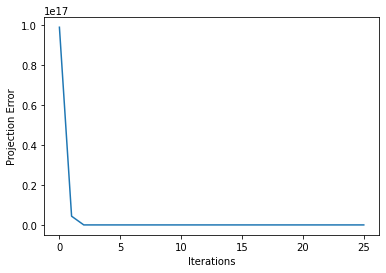

In [63]:
T = estimate_pose_GN(poses_new[0][:3,:], correspondences[0], correspondences[1], K, 25, tol = 1e-20, plot_error = True)